# Image Clustering

We want to cluster images based on their metrics (contrast, blur etc.) and determine if the same preprocessing can be perfomed on each image in a cluster

In [1]:
%matplotlib inline

import os
import random

from matplotlib import pyplot as plt
from scipy.optimize import curve_fit

import seaborn as sns

import numpy as np
import pandas as pd
import cv2

In [2]:
# get the list of filenames in a given directory

camera_view = 'KL11-E1DC'

availible_ids = [int(file.split('.')[0])
                 for file in os.listdir(f"../../{camera_view}/") 
                 if file.endswith(".png")]

print(f'number of unique images: {len(availible_ids)}')
print(f'number of pairs: {len(availible_ids)*len(availible_ids)-1}')

number of unique images: 109
number of pairs: 11880


In [3]:
# some helper functions
def load_img(camera_view,img_id):
    return cv2.imread(f'../../{camera_view}/{img_id}.png', 
                      cv2.IMREAD_GRAYSCALE)


def plot_two(img_a, name_a, img_b, name_b):
    plt.figure(1, figsize=(13,13))
    
    plt.subplot(121)
    plt.title(name_a)
    plt.imshow(img_a)

    plt.subplot(122)
    plt.title(name_b)
    plt.imshow(img_b)
    
    plt.show()
    
def plot_hist(img_a, name_a, img_b, name_b, p, x, color):
    plt.figure(1, figsize=(6,3))
    
    plt.subplot(121)
    plt.title(name_a)
    plt.imshow(img_a)

    plt.subplot(122)
    plt.xlim([0,256])
    plt.plot(x, p, 'g', linewidth=2)
    plt.title(name_b)
    plt.plot(img_b,color)
    
    plt.show()


def plot_three(imgs, names):
    # there is probably a better way...
    plt.figure(1, figsize=(17,10))
    
    for i in range(3):
        
        plt.subplot(131 + i)
        plt.title(names[i])
        plt.imshow(imgs[i])
    
    plt.show()

    

def map_2_params_Laplace(img, _operation, x_params, x_param_name, y_params, y_param_name):
    """ 
    Makes a 2D grid of plots by applying the function '_operation' to 'img'
    accross the parameter space defined in the other arguments
    """
    new_imgs = []
    # set up axes
    fig, axs = plt.subplots(nrows=len(x_params), 
                            ncols=len(y_params),
                            sharex='col', sharey='row',
                            figsize=(15,15.4))
    
    #Compute the variance of the Laplacian
    

    # loop through axes and make each plot
    for i, x_param in enumerate(x_params):        
        for j, y_param in enumerate(y_params):
            
            # plot image with these parameters
            im = _operation(img, x_param, y_param)
            axs[j,i].imshow(im)
            new_imgs.append(im)
            #axs[j,i].imshow(cv2.Canny(_operation(img, x_param, y_param), 80, 140, apertureSize=3, L2gradient=True))
            Laplace = cv2.Laplacian(_operation(img, x_param, y_param), cv2.CV_64F).var()
            
            # decide whether or not to label axes
            if j == 0:
                axs[j,i].set_title(f'{x_param_name} = {x_param:.2f}')
            if i == 0:
                axs[j,i].set_ylabel((f'{y_param_name} = {y_param:.2f}'), fontsize=12)
            
            #Show the variance of the Laplacian
            axs[j,i].set_xlabel((f'Variance = {Laplace:.2f}'))
            
            # tick hiding
            axs[j,i].tick_params(
                bottom=False,
                left=False,
                labelbottom=False,
                labelleft=False)
    
    # title
    fig.text(0.5, 0.92, f'Applying {_operation.__name__}()', ha='center', va='center', fontsize=14)
    
    # formatting
    fig.subplots_adjust(hspace=0.1, wspace=0.1)
    return new_imgs, fig
    
    
def prelim_plot_blur(imgs, imagenames):
    N = len(imgs)
    ncols = 3
    nrows = int((N+2)/3)
    k=0
    
    fig, axs = plt.subplots(nrows, 
                            ncols,
                            sharex='col', sharey='row',
                            figsize=(15,15.4))
    
    for i in range(0,ncols):        
        for j in range(0,nrows):
            
            # plot image with these parameters
            axs[j,i].imshow(imgs[k])
            #axs[j,i].imshow(cv2.Canny(_operation(img, x_param, y_param), 80, 140, apertureSize=3, L2gradient=True))
            Laplace = cv2.Laplacian(imgs[k], cv2.CV_64F).var()
            
            # decide whether or not to label axes
            
            #Show the variance of the Laplacian
            axs[j,i].set_xlabel((f'Variance = {Laplace:.2f}'))
            axs[j,i].set_title(imagenames[k])
            
            # tick hiding
            axs[j,i].tick_params(
                bottom=False,
                left=False,
                labelbottom=False,
                labelleft=False)
            if k == N-1:
                return
            else:
                k+=1

def blur_params(img):      
    return cv2.Laplacian(img, cv2.CV_64F).var()

def contrast_params(images):
    contrast_param = []
    hist = []
    for img in images:
        histImage = draw_image_histogram(img, [0])
        hist.append(histImage)
        #histImage = preprocessing.normalize(histImage)
        bin_centres = np.arange(0,len(histImage))
        histImage = np.array([i[0] for i in histImage])
        mean = sum(bin_centres * histImage)
        sigma = sum(bin_centres * (histImage - mean)**2)
        p0 = [1.0, 126, 50]

        coeff, var_matrix = curve_fit(gauss, bin_centres, histImage, p0=p0)

# Get the fitted curve
        hist_fit = gauss(bin_centres, coeff[0], coeff[1], coeff[2])
        x = range(0,256,1)
        contrast_param.append(coeff[2])
    return contrast_param

def noise_params(im):
    criticalValue = 0.4
    k = 0
    isNoise = 0
    i = 0
    j = 0
    for row in im:
        for col in row:
            if(j+1 == len(row)):
                break
            elif(np.abs(im[i,j]) == 0 or np.abs(im[i,j+1]) == 0):
                pass
            elif(np.abs(1 - int(im[i,j])/(int(im[i,j+1]))) > criticalValue):
                isNoise += 1
            j +=1
        i +=1
    noise_param = (isNoise)
    k += 1
    return noise_param

In [4]:
def correct_contrast(img, clip_limit=3, tile_size=7):
    
    # create the object
    clahe = cv2.createCLAHE(clipLimit=clip_limit, 
                            tileGridSize=(tile_size, tile_size))
    
    # apply equalisation
    return clahe.apply(img)

In [5]:
def get_Histogram(image):
    bgr_planes = cv2.split(image)

    histSize = 256
    histRange = (0, 256) # the upper boundary is exclusive
    accumulate = False

    b_hist = cv2.calcHist(bgr_planes, [0], None, [histSize], histRange, accumulate=accumulate)
    g_hist = cv2.calcHist(bgr_planes, [1], None, [histSize], histRange, accumulate=accumulate)
    r_hist = cv2.calcHist(bgr_planes, [2], None, [histSize], histRange, accumulate=accumulate)

    hist_w = 512
    hist_h = 400

    bin_w = int(hist_w/histSize)
    histImage = np.zeros((hist_h, hist_w, 3), dtype=np.uint8)

    cv2.normalize(b_hist, b_hist, alpha=0, beta=hist_h, norm_type=cv2.NORM_MINMAX)
    cv2.normalize(g_hist, g_hist, alpha=0, beta=hist_h, norm_type=cv2.NORM_MINMAX)
    cv2.normalize(r_hist, r_hist, alpha=0, beta=hist_h, norm_type=cv2.NORM_MINMAX)

    for i in range(1, histSize):
        cv2.line(histImage, ( bin_w*(i-1), hist_h - int(b_hist[i-1]) ),
                ( bin_w*(i), hist_h - int(b_hist[i]) ),
                ( 255, 0, 0), thickness=2)
        cv2.line(histImage, ( bin_w*(i-1), hist_h - int(g_hist[i-1]) ),
                ( bin_w*(i), hist_h - int(g_hist[i]) ),
                ( 0, 255, 0), thickness=2)
        cv2.line(histImage, ( bin_w*(i-1), hist_h - int(r_hist[i-1]) ),
                ( bin_w*(i), hist_h - int(r_hist[i]) ),
                ( 0, 0, 255), thickness=2)
    return histImage

def draw_image_histogram(image, channels):
    hist = cv2.calcHist([image], channels, None, [256], [0, 256])
    hist = cv2.normalize(hist, None)
    bin_centres = np.arange(0,len(hist))
    hist = np.array([i[0] for i in hist])
    mean = sum(bin_centres * hist)
    sigma = sum(bin_centres * (hist - mean)**2)
    return hist, mean, sigma

def gauss(x, A, mu, sigma):
    return A*np.exp(-(x-mu)**2/(2.0*sigma**2))


In [6]:
images = []
camera_view = 'KL11-E1DC'
for img_id in availible_ids:
    images.append(load_img(camera_view,img_id))

#### Make measurements of different metrics for all the images

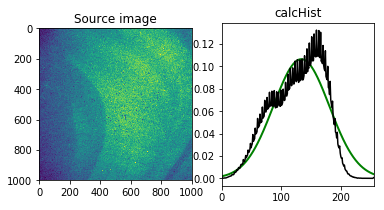

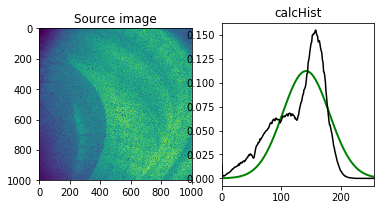

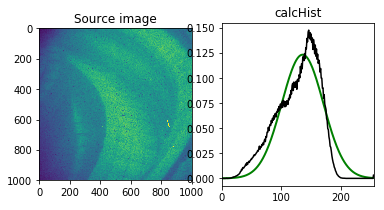

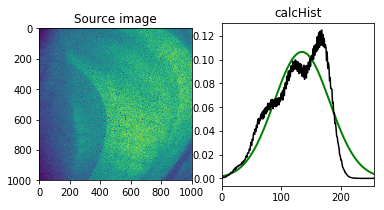

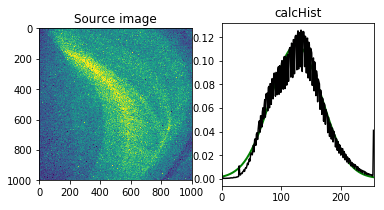

...

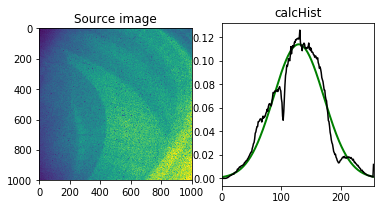

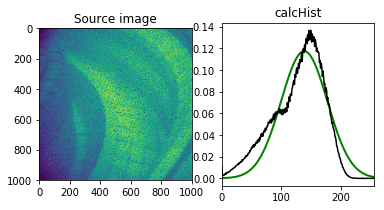

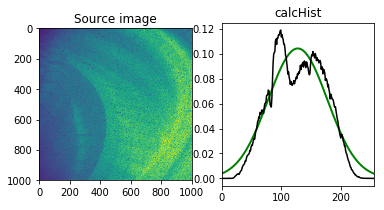

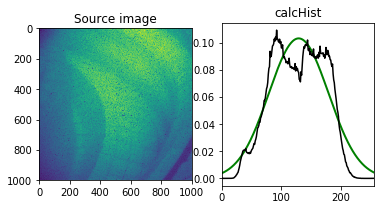

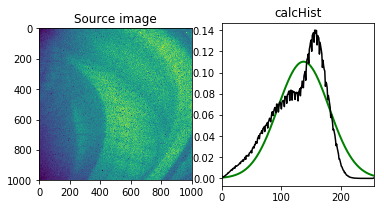

In [8]:
contrast_param = []
hist = []
means = []
contrast = []
res = []
skew = []
noise = []
blur = []
for img in images:
    histImage, mean, sigma = draw_image_histogram(img, [0])

    bin_centres = np.arange(0,len(histImage))
    p0 = [1.0, 126, 50]
    coeff, var_matrix = curve_fit(gauss, bin_centres, histImage, p0=p0)
    
    means.append(coeff[1])
    
    contrast.append(coeff[2])
    
    skew.append(mean-coeff[1])
    
    noise.append(noise_params(img))
    
    blur.append(blur_params(img))
    
    # Get the fitted curve
    hist_fit = gauss(bin_centres, coeff[0], coeff[1], coeff[2])
    x = range(0,256,1)
    plot_hist(img,'Source image', histImage, 'calcHist', hist_fit, x, color = 'k')

    l2_res = sum((hist_fit-histImage)**2)
    res.append(l2_res)

Clustering based on fit properties  
 - mean
 - variance
 - l2-norm residual $\sum_{i}(histfit_{i} - hist_{i})^2$
 - skew $mean_{hist}-mean_{fit}$
 - noise
 - blur

In [9]:
d = {'mean': means, 'contrast':contrast, 'residuals':res, 'skew':skew, 'noise':noise, 'blur':blur}
fits = pd.DataFrame(d,index=availible_ids)

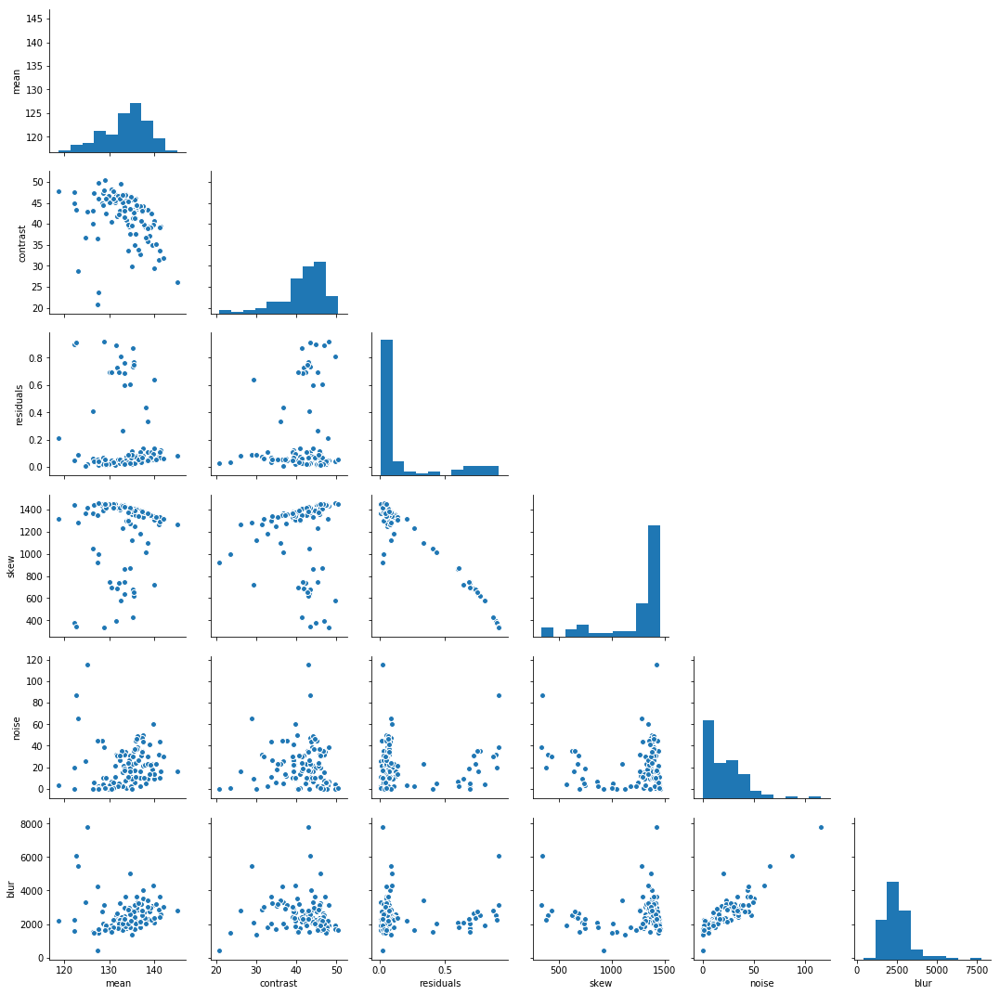

In [10]:
g = sns.pairplot(fits)
for i, j in zip(*np.triu_indices_from(g.axes, 1)):
    g.axes[i, j].set_visible(False)

Interestingly all the fits are positively skewed, i.e. the mean of the histogram is always larger than the fit.  Skewness also negatively correlates with residual

Noise and blur also correlated as previously seen

## Pick possible properties by which images can be grouped

0.2 < Res < 0.55

In [11]:
low_res = []
for i in fits.index:
    if fits.at[i,'residuals'] <= 0.2:
        low_res.append('low')
    if fits.at[i,'residuals'] > 0.2 and fits.at[i,'residuals'] <= 0.55:
        low_res.append('med')
    if fits.at[i,'residuals'] > 0.55:
        low_res.append('high')

fits['res_cluster'] = pd.Series(low_res,index=availible_ids)

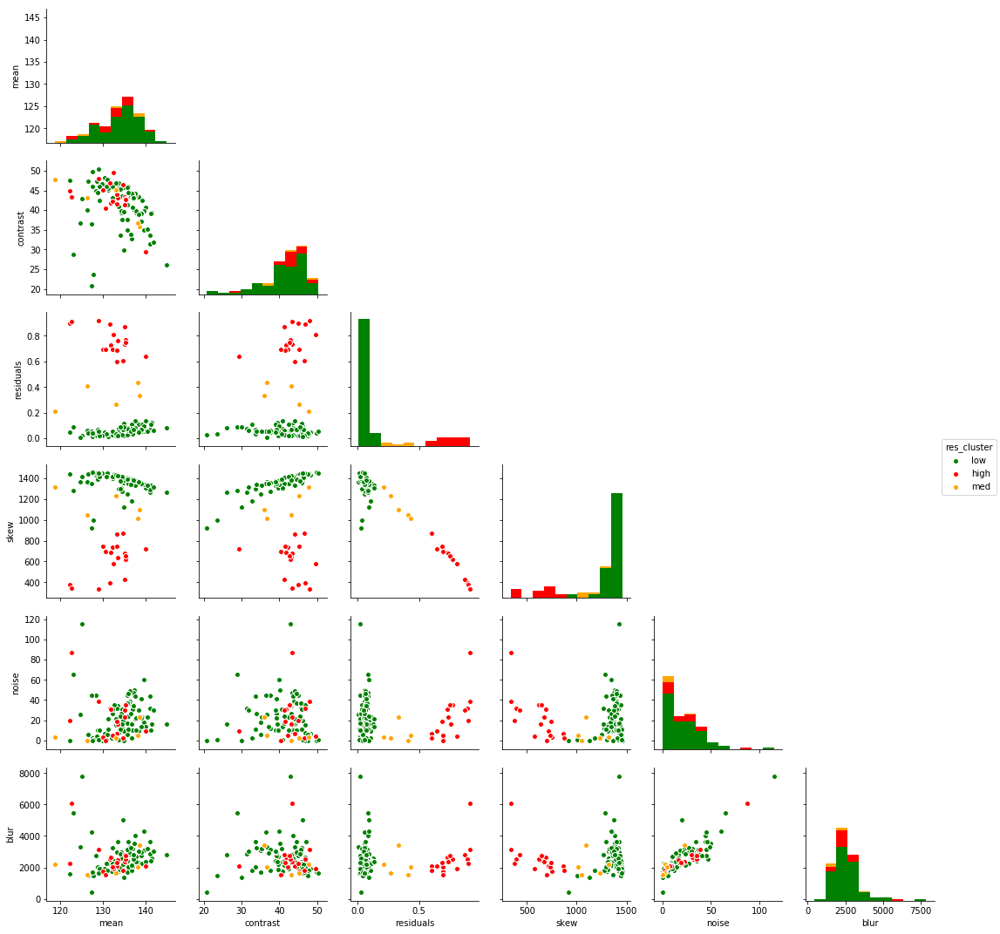

In [21]:
palette = {'low':'g','med':'orange','high':'r'}
g = sns.pairplot(fits,hue='res_cluster',palette=palette)
for i, j in zip(*np.triu_indices_from(g.axes, 1)):
    g.axes[i, j].set_visible(False)

Show high residual images

Imgage I.D 92043


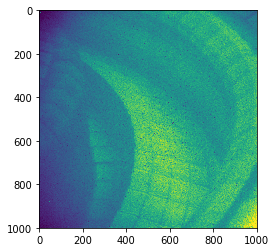

Imgage I.D 91981


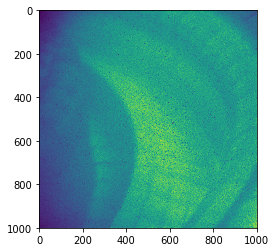

Imgage I.D 92047


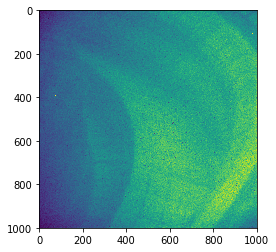

Imgage I.D 92036


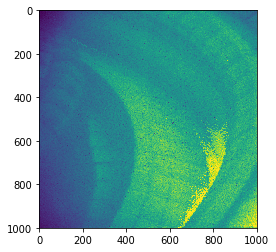

Imgage I.D 92197


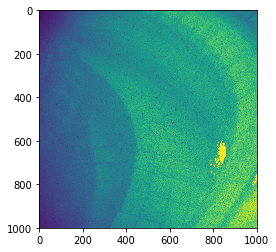

Imgage I.D 92034


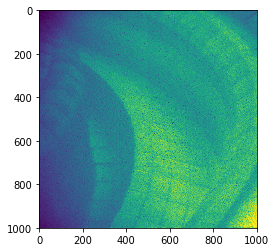

Imgage I.D 92035


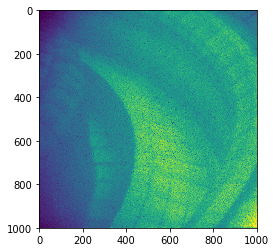

Imgage I.D 92182


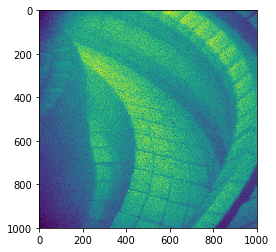

Imgage I.D 92031


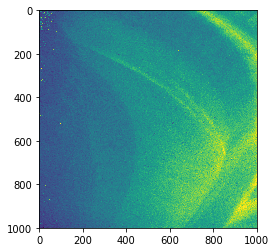

Imgage I.D 92144


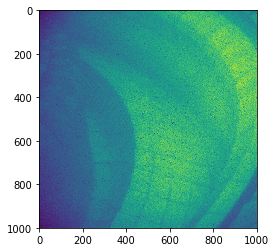

Imgage I.D 92033


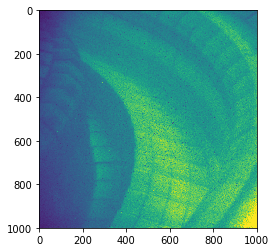

Imgage I.D 92189


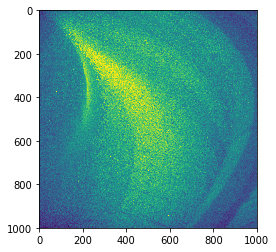

Imgage I.D 92176


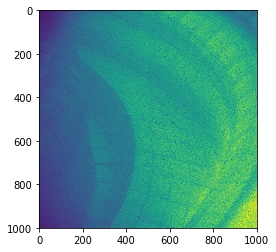

Imgage I.D 92003


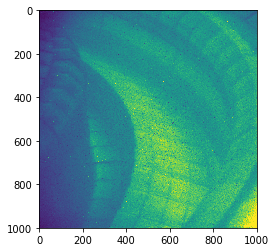

Imgage I.D 92006


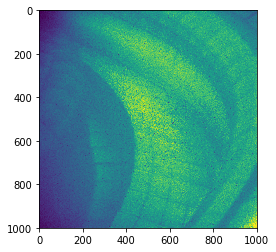

Imgage I.D 92049


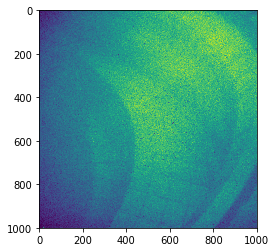

Imgage I.D 91972


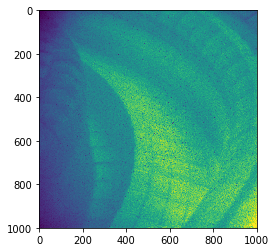

Imgage I.D 92098


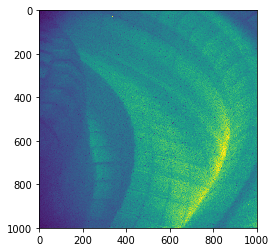

In [13]:
for img_id in fits.index:
    if fits.at[img_id,'res_cluster'] == 'high':
        img = load_img('KL11-E1DC',img_id)
        plt.figure()
        plt.imshow(img)
        print(f'Imgage I.D {img_id}')
        plt.show()

30 < Variance < 40

In [14]:
low_cont = []
for i in fits.index:
    if fits.at[i,'contrast'] <= 30:
        low_cont.append('low')
    if fits.at[i,'contrast'] > 30 and fits.at[i,'contrast'] <= 40:
        low_cont.append('med')
    if fits.at[i,'contrast'] > 40:
        low_cont.append('high')

fits['cont_cluster'] = pd.Series(low_cont,index=availible_ids)

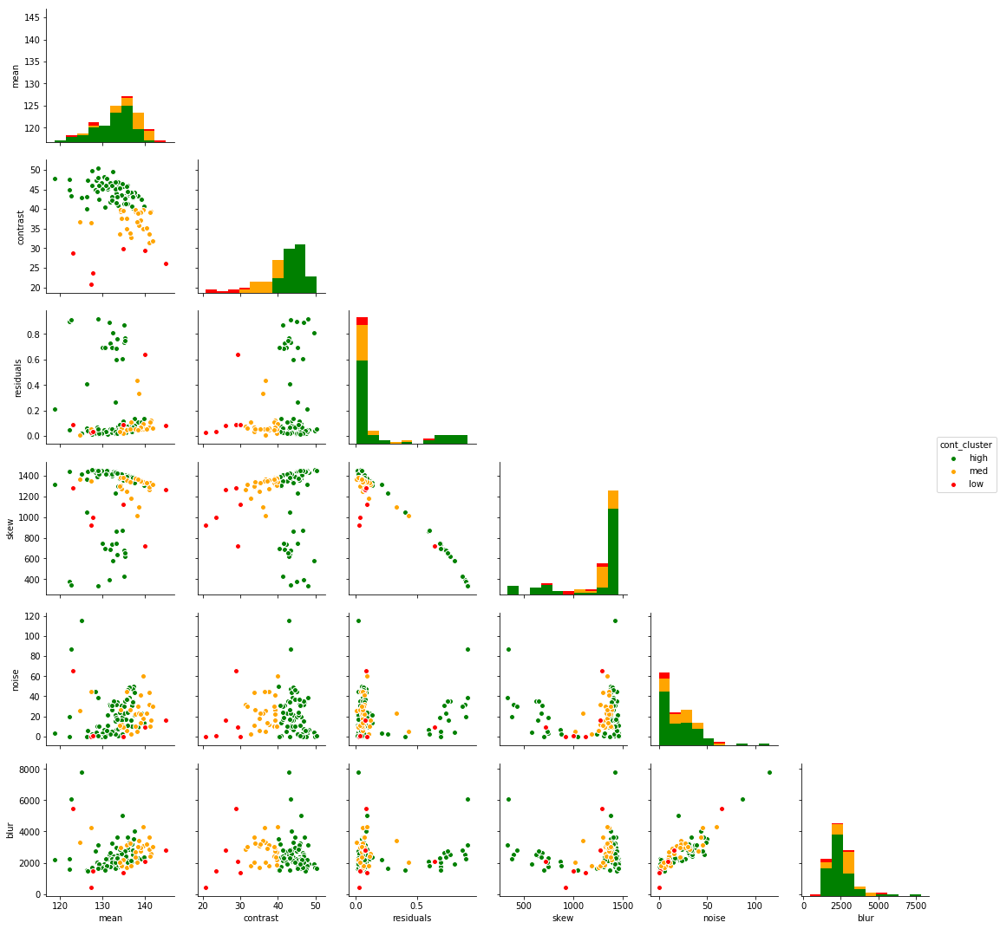

In [23]:
palette = {'high':'g','med':'orange','low':'r'}
g = sns.pairplot(fits,hue='cont_cluster',palette=palette)
for i, j in zip(*np.triu_indices_from(g.axes, 1)):
    g.axes[i, j].set_visible(False)

Eyeball original images and say if it's good, decent or bad

In [16]:
g,d,b='good','decent','bad'
eyeball = pd.Series([b,d,b,d,b,b,b,g,d,b,
                     g,g,d,b,g,g,d,d,d,d,
                     b,b,d,b,g,d,b,b,d,g,
                     d,b,d,d,d,b,b,g,g,g,
                     d,d,g,d,g,b,g,g,d,b,
                     d,d,d,d,b,g,b,b,d,b,
                     g,b,d,b,d,d,d,g,g,d,
                     d,g,g,b,g,d,g,d,g,d,
                     d,d,g,d,b,g,b,d,d,b,
                     d,d,b,b,b,b,d,d,d,b,
                     b,g,b,g,b,g,d,b,d],
                    index=availible_ids)
sum(eyeball==b),sum(eyeball==d),sum(eyeball==g)

(36, 45, 28)

In [17]:
fits['eyeball'] = eyeball

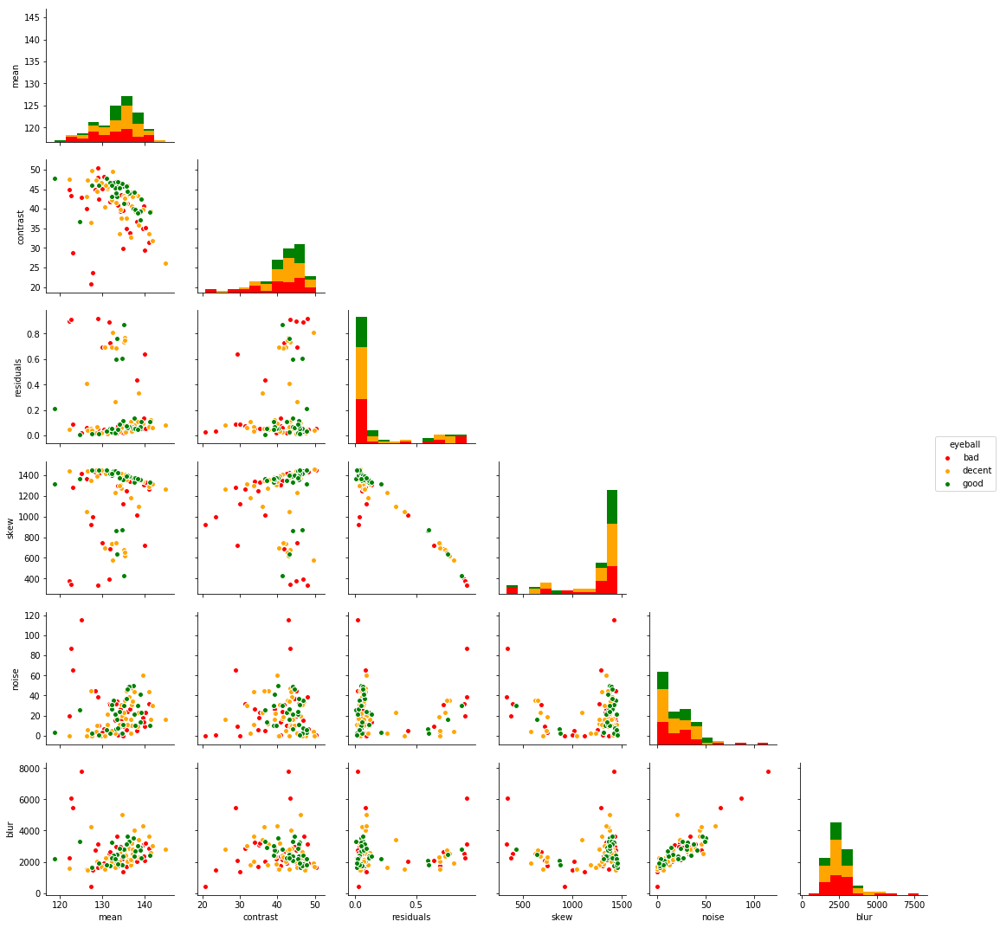

In [24]:
palette = {'good':'g','decent':'orange','bad':'r'}
g = sns.pairplot(fits,hue='eyeball',palette=palette)
for i, j in zip(*np.triu_indices_from(g.axes, 1)):
    g.axes[i, j].set_visible(False)

Show the four high noise and blur images

Imgage I.D 90469
noise  115
contrast  high
residual  low


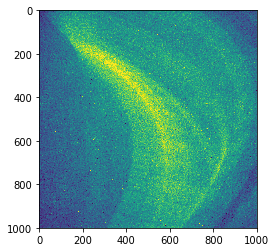

Imgage I.D 92189
noise  87
contrast  high
residual  high


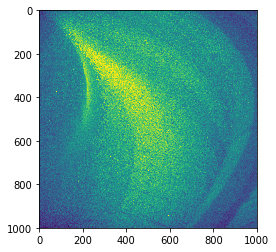

Imgage I.D 91522
noise  65
contrast  low
residual  low


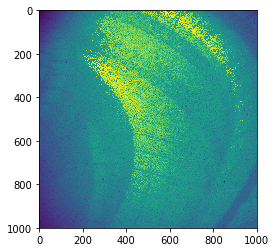

In [27]:
for img_id in fits.index:
    if fits.at[img_id,'eyeball'] == 'bad':
        if fits.at[img_id,'blur'] > 5000:
            img = load_img('KL11-E1DC',img_id)
            plt.figure()
            plt.imshow(img)
            print(f'Imgage I.D {img_id}')
            print('noise ',fits.at[img_id,'noise'])
            print('contrast ',fits.at[img_id,'cont_cluster'])
            print('residual ',fits.at[img_id,'res_cluster'])
            plt.show()

Measure of residual doesn't seem particularly good.  Fitting well with histogram doesn't necessarily mean it's a good image.  Maybe try calculate residual relative to histogram of composite image?